In [ ]:
import pandas as pd
import numpy as np
import warnings
from tqdm import tqdm_notebook

warnings.filterwarnings(action='ignore')
DATA_DIR = '/content/drive/MyDrive/투빅스 컨퍼런스/Data/'

# 이미지 데이터 가져오기

In [ ]:
import pickle

image_dict = {}

# load
for i in range(5):
  with open(DATA_DIR + f'image_data_dict_v2_{i + 1}.pickle', 'rb') as f:
      image = pickle.load(f)
      
  image_dict.update(image)

len(image_dict)

22458

# 데이터 가져오기

In [ ]:
all_df = pd.read_csv(DATA_DIR + 'steam_reviews_clean_result.csv')
Steam_meta_df = pd.read_csv(DATA_DIR + 'steam_image_meta_data_clean_result.csv')
# train_df = pd.read_csv(DATA_DIR + 'steam_reviews_clean_train_df.csv')
# test_df = pd.read_csv(DATA_DIR + 'steam_reviews_clean_test_df.csv')

# 데이터 전처리

## 선호도를 분류하지 않은 데이터 전처리

In [ ]:
user_id_li = all_df['user_id'].unique()

user_play_game_li = []

user_play_game_df = []

for user_id in tqdm_notebook(user_id_li):
  game = all_df[all_df['user_id'] == user_id].sort_values(by = 'timestamp')['game_id'].astype(str).values.tolist()
  user_play_game_li.append(game)

  user_play_game_df.append(
      {'user_id' : user_id,
       'game_count' : len(game)}
  )

In [ ]:
user_play_game_df = pd.DataFrame(user_play_game_df)
user_play_game_df.sort_values(by = 'game_count', ascending=False)

,user_id,game_count
682,76561198030784015,3678
1117,MostOG,3382
1187,5e4,2963
12309,76561198094803808,2500
1116,kanehero,2477
...,...,...
1178,WizardIF,5
15791,76561198057797146,5
1171,76561198031349373,5
11322,criticaltortoise,5


In [ ]:
len(user_play_game_li)

29921

In [ ]:
import pickle

# save
with open(DATA_DIR + 'user_play_game_li_data_result.pickle', 'wb') as f:
    pickle.dump(user_play_game_li, f, pickle.HIGHEST_PROTOCOL)

# load
with open(DATA_DIR + 'user_play_game_li_data_result.pickle', 'rb') as f:
    data = pickle.load(f)

len(data)

29921

## 선호도를 분류한 데이터 전처리

In [ ]:
def data_splitter(df):
  gp_user_like = df.groupby(['recommended', 'user_id'])
  # 선호 게임과 비선호 게임의 시퀀스를 분리
  return ([gp_user_like.get_group(gp)['game_id'].astype(str).tolist() for gp in gp_user_like.groups])

In [ ]:
rec_user_play_game_li = data_splitter(all_df)

In [ ]:
len(rec_user_play_game_li)

53992

In [ ]:
import pickle

# save
with open(DATA_DIR + 'rec_user_play_game_li_data_result.pickle', 'wb') as f:
    pickle.dump(rec_user_play_game_li, f, pickle.HIGHEST_PROTOCOL)

# load
with open(DATA_DIR + 'rec_user_play_game_li_data_result.pickle', 'rb') as f:
    data = pickle.load(f)

len(data)

53992

# 모델 학습

모델 파라미터는 모두 동일하게 만들고 동일한 게임으로 비교하여 동일한 조건에서 모델의 성능을 평가

순서 셔플은 시간에 따른 중요도를 의미

선호도를 나누는 것은 좋아하는 게임과 싫어하는 게임의 임베딩을 다르게 하기 위함

참고: https://github.com/bwange/Item2vec_Tutorial_with_Recommender_System_Application/blob/master/Making_Your_Own_Recommender_System_with_Item2Vec.ipynb

In [ ]:
import pickle
import random

# load
with open(DATA_DIR + 'rec_user_play_game_li_data_result.pickle', 'rb') as f:
  rec_yes_shuffle_yes_user_play_game_li = pickle.load(f)

for user_play_game_li in rec_yes_shuffle_yes_user_play_game_li:
  random.Random(22).shuffle(user_play_game_li)

len(rec_yes_shuffle_yes_user_play_game_li)

53992

선호도 구분 O, 순서 셔플 O

In [ ]:
import pickle

# load
with open(DATA_DIR + 'rec_user_play_game_li_data_result.pickle', 'rb') as f:
  rec_yes_shuffle_no_user_play_game_li = pickle.load(f)

len(rec_yes_shuffle_no_user_play_game_li)

53992

선호도 구분 O, 순서 셔플 X

In [ ]:
import pickle
import random

# load
with open(DATA_DIR + 'user_play_game_li_data_result.pickle', 'rb') as f:
  rec_no_shuffle_yes_user_play_game_li = pickle.load(f)

for user_play_game_li in rec_no_shuffle_yes_user_play_game_li:
  random.Random(22).shuffle(user_play_game_li)

len(rec_no_shuffle_yes_user_play_game_li)

29921

선호도 구분 X, 순서 셔플 O

In [ ]:
import pickle

# load
with open(DATA_DIR + 'user_play_game_li_data_result.pickle', 'rb') as f:
  rec_no_shuffle_no_user_play_game_li = pickle.load(f)

len(rec_no_shuffle_no_user_play_game_li)

29921

선호도 구분 X, 순서 셔플 X

## 추천 데이터 확인을 위한 함수

In [ ]:
# game_id2title
game_id2title = {}

# game_id2content
game_id2content = {}

# game_id2clean_genres
game_id2clean_genres = {}

def get_data(x):
  game_id2title[x['game_id']] = x['title']
  game_id2content[x['game_id']] = x['content']
  game_id2clean_genres[x['game_id']] = x['clean_genres']

_ = Steam_meta_df.apply(lambda x : get_data(x), axis = 1)

In [ ]:
from PIL import Image

def get_sim_game(model, game_id):
  choise_game_title = game_id2title[int(game_id)]
  choise_game_content = game_id2content[int(game_id)]
  choise_game_clean_genres = game_id2clean_genres[int(game_id)]
  
  print('-'*100)
  print(f'선택된 게임의 ID: {game_id}, 선택된 게임의 title: {choise_game_title}')
  print(f'선택된 게임의 content: {choise_game_content}')
  print(f'선택된 게임의 genres: {choise_game_clean_genres}')
  img = Image.fromarray(image_dict[int(game_id)])
  display(img)
  print('-'*100)

  sim_game_li = model.most_similar_cosmul(game_id)
  for idx, (sim_game_id, sim_score) in enumerate(sim_game_li):

    sim_game_title = game_id2title[int(sim_game_id)]
    sim_game_content = game_id2content[int(sim_game_id)]
    sim_game_clean_genres = game_id2clean_genres[int(sim_game_id)]

    print('-'*100)
    print(f'TOP{idx + 1} 게임의 ID: {sim_game_id}, title: {sim_game_title}, Score: {sim_score}')
    print(f'선택된 게임의 content: {sim_game_content}')
    print(f'선택된 게임의 genres: {sim_game_clean_genres}')
    img = Image.fromarray(image_dict[int(sim_game_id)])
    display(img)
    print('-'*100)

## 기존 모델의 결과

----------------------------------------------------------------------------------------------------
선택된 게임의 ID: 7670, 선택된 게임의 title: BioShock™
선택된 게임의 content: BioShock is a shooter unlike any you've ever played, loaded with weapons and tactics never seen. You'll have a complete arsenal at your disposal from simple revolvers to grenade launchers and chemical throwers, but you'll also be forced to genetically modify your DNA to create an even more deadly weapon: you.
선택된 게임의 genres: ['FPS', 'Atmospheric', 'Story Rich', 'Action', 'Singleplayer', 'Horror', 'Steampunk', 'First-Person', 'Shooter', 'Sci-fi', 'RPG', 'Classic', 'Adventure', 'Dystopian ', 'Underwater', 'Immersive', 'Dark', 'Political', 'Great Soundtrack', 'Alternate History']


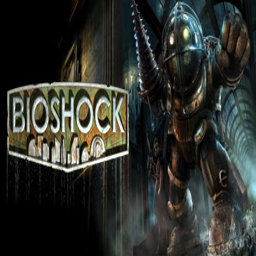

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP1 게임의 ID: 225080, title: Brothers - A Tale of Two Sons, Score: 0.7548143863677979
선택된 게임의 content: Guide two brothers on an epic fairy tale journey from visionary Swedish film director, Josef Fares and top-tier developer Starbreeze Studios. Control both brothers at once as you experience co-op play in single player mode, like never before.
선택된 게임의 genres: ['Adventure', 'Atmospheric', 'Story Rich', 'Controller', 'Indie', 'Emotional', 'Puzzle', 'Short', 'Fantasy', 'Singleplayer', 'Beautiful', 'Great Soundtrack', 'Action', 'Local Co-Op', 'Platformer', 'Third Person', 'Multiplayer', 'Casual', '3D Vision', 'Walking Simulator']


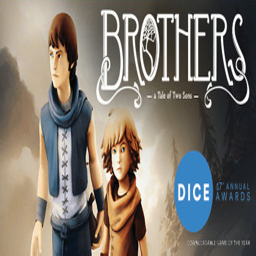

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP2 게임의 ID: 8980, title: Borderlands Game of the Year, Score: 0.7449690103530884
선택된 게임의 content: Get ready for the mind blowing insanity! Play as one of four trigger-happy mercenaries and take out everything that stands in your way! With its addictive action, frantic first-person shooter combat, massive arsenal of weaponry, RPG elements and four-player co-op, Borderlands is a breakthrough experience that challenges all the...
선택된 게임의 genres: ['Looter Shooter', 'FPS', 'Co-op', 'RPG', 'Action', 'Loot', 'Shooter', 'Online Co-Op', 'First-Person', 'Open World', 'Comedy', 'Multiplayer', 'Sci-fi', 'Post-apocalyptic', 'Singleplayer', 'Action RPG', 'Funny', 'Dark Humor', 'Adventure', 'Gore']


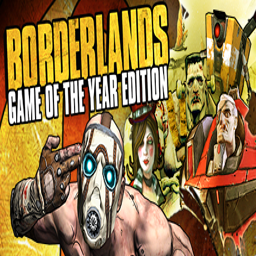

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP3 게임의 ID: 205100, title: Dishonored, Score: 0.7380874156951904
선택된 게임의 content: Dishonored is an immersive first-person action game that casts you as a supernatural assassin driven by revenge. With Dishonored’s flexible combat system, creatively eliminate your targets as you combine the supernatural abilities, weapons and unusual gadgets at your disposal.
선택된 게임의 genres: ['Stealth', 'First-Person', 'Action', 'Steampunk', 'Assassin', 'Singleplayer', 'Atmospheric', 'Story Rich', 'Adventure', 'Multiple Endings', 'Dark', 'Magic', 'Dystopian ', 'FPS', 'RPG', 'Replay Value', 'Fantasy', 'Open World', 'Immersive Sim', 'Shooter']


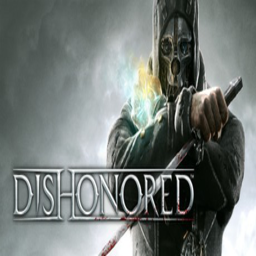

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP4 게임의 ID: 12900, title: AudioSurf, Score: 0.7375882863998413
선택된 게임의 content: Ride your music. Audiosurf is a music-adapting puzzle racer where you use your own music to create your own experience. The shape, the speed, and the mood of each ride is determined by the song you choose.
선택된 게임의 genres: ['Music', 'Rhythm', 'Indie', 'Casual', 'Music-Based Procedural Generation', 'Arcade', 'Colorful', 'Singleplayer', 'Relaxing', 'Score Attack', 'Addictive', 'Local Co-Op', 'Procedural Generation', 'Replay Value', 'Puzzle', 'Great Soundtrack', 'Fast-Paced', 'Racing', 'Co-op', 'Local Multiplayer']


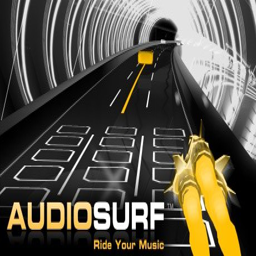

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP5 게임의 ID: 17460, title: Mass Effect (2007), Score: 0.7372365593910217
선택된 게임의 content: As Commander Shepard, you lead an elite squad on a heroic, action-packed adventure throughout the galaxy. Discover the imminent danger from an ancient threat and battle the traitorous Saren and his deadly army to save civilization. The fate of all life depends on your actions!
선택된 게임의 genres: ['RPG', 'Sci-fi', 'Story Rich', 'Action', 'Space', 'Third-Person Shooter', 'Singleplayer', 'Great Soundtrack', 'Choices Matter', 'Third Person', 'Character Customization', 'Shooter', 'Female Protagonist', 'Adventure', 'Romance', 'Atmospheric', 'Open World', 'Real-Time with Pause', 'Action RPG', 'Immersive']


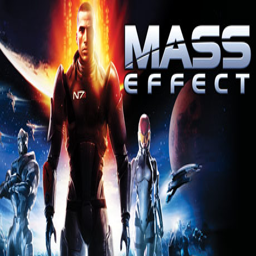

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP6 게임의 ID: 203810, title: Dear Esther, Score: 0.7325752973556519
선택된 게임의 content: Begin a journey through one of the most original first-person games of recent years.
선택된 게임의 genres: ['Walking Simulator', 'Indie', 'Exploration', 'First-Person', 'Atmospheric', 'Short', 'Story Rich', 'Casual', 'Adventure', 'Great Soundtrack', 'Singleplayer', 'Narration', 'Mystery', 'Relaxing', 'Beautiful', 'Experimental', 'Interactive Fiction', 'Soundtrack', 'Linear', 'Emotional']


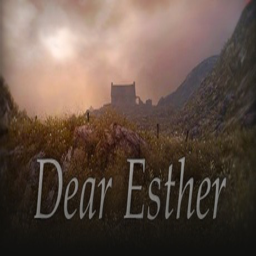

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP7 게임의 ID: 327410, title: A Bird Story, Score: 0.7280700206756592
선택된 게임의 content: An experimental short from the creator of To the Moon & Finding Paradise: A simple & surreal 1-hour interactive animation about a boy and an injured bird, told without dialogues.
선택된 게임의 genres: ['Indie', 'Story Rich', 'Great Soundtrack', 'Pixel Graphics', 'Short', 'RPGMaker', 'Adventure', 'Singleplayer', 'Interactive Fiction', '2D', 'RPG', 'Atmospheric', 'Visual Novel', 'Retro', 'Emotional', 'Casual', 'Walking Simulator', 'Surreal', 'Top-Down', 'Cute']


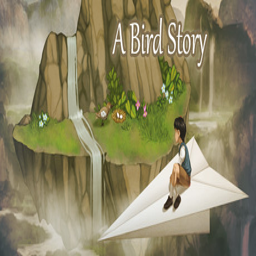

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP8 게임의 ID: 17410, title: Mirror's Edge™, Score: 0.7279058694839478
선택된 게임의 content: In a city where information is heavily monitored, couriers called Runners transport sensitive data. In this seemingly utopian paradise, a crime has been committed, & you are being hunted. You are a Runner called Faith and this innovative first-person action-adventure is your story.
선택된 게임의 genres: ['Parkour', 'First-Person', 'Action', 'Female Protagonist', 'Singleplayer', 'Great Soundtrack', 'Adventure', 'Platformer', 'Atmospheric', 'Dystopian ', 'Stylized', 'Futuristic', 'Sci-fi', 'FPS', 'Cyberpunk', 'Colorful', 'Puzzle', 'Time Attack', 'Classic', 'Short']


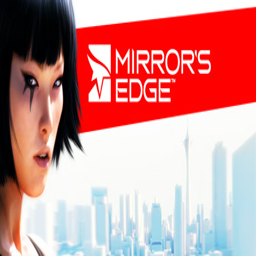

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP9 게임의 ID: 8870, title: BioShock Infinite, Score: 0.7238892912864685
선택된 게임의 content: Indebted to the wrong people, with his life on the line, veteran of the U.S. Cavalry and now hired gun, Booker DeWitt has only one opportunity to wipe his slate clean. He must rescue Elizabeth, a mysterious girl imprisoned since childhood and locked up in the flying city of Columbia.
선택된 게임의 genres: ['FPS', 'Story Rich', 'Action', 'Singleplayer', 'Steampunk', 'Atmospheric', 'Shooter', 'First-Person', 'Alternate History', 'Beautiful', 'Adventure', 'Great Soundtrack', 'Dystopian ', 'Sci-fi', 'Time Travel', 'Fantasy', 'Gore', 'Linear', 'RPG', 'Immersive']


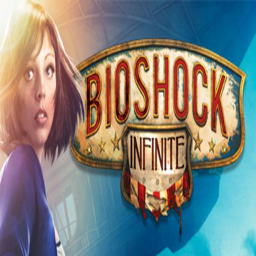

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP10 게임의 ID: 203750, title: Binary Domain, Score: 0.7235967516899109
선택된 게임의 content: Set in futuristic Tokyo, take control of the robotic community before they control everything!
선택된 게임의 genres: ['Action', 'Third-Person Shooter', 'Sci-fi', 'Cyberpunk', 'Robots', 'Shooter', 'Story Rich', 'Third Person', 'Transhumanism', 'Singleplayer', 'Futuristic', 'Adventure', 'Co-op', 'Multiplayer', 'Dystopian ', 'Controller', 'Voice Control', 'Atmospheric', 'RPG', 'Great Soundtrack']


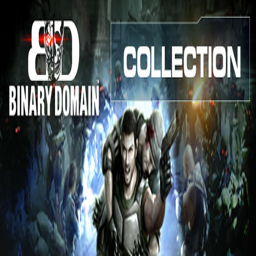

----------------------------------------------------------------------------------------------------


In [ ]:
# BioShock™
get_sim_game(loaded_model, '7670')

## 선호도 구분 데이터 O / 셔플 O 모델

In [ ]:
from gensim.models import Word2Vec
import datetime

start = datetime.datetime.now()

rec_yes_shuffle_yes_model = Word2Vec(sentences = rec_yes_shuffle_yes_user_play_game_li,
                        iter = 10,
                        min_count = 1,
                        size = 300,
                        workers = 4,
                        sg = 1,
                        hs = 0,
                        negative = 5,
                        window = 9999999)

rec_yes_shuffle_yes_model.wv.save_word2vec_format(DATA_DIR + 'rec_yes_shuffle_yes_model_min_count_1') # 모델 저장

print("Time passed: " + str(datetime.datetime.now() - start))

Time passed: 0:43:56.112436


In [ ]:
from gensim.models import KeyedVectors

rec_yes_shuffle_yes_model = KeyedVectors.load_word2vec_format(DATA_DIR + "rec_yes_shuffle_yes_model") # 모델 로드

----------------------------------------------------------------------------------------------------
선택된 게임의 ID: 546050, 선택된 게임의 title: Puyo Puyo™Tetris®
선택된 게임의 content: Two puzzle game juggernauts collide as global phenomenon Tetris® and SEGA’s famous Puyo Puyo™ combine in a super mash-up of ferocious competition, adorable looks, and addictive puzzle fun!
선택된 게임의 genres: ['Puzzle', 'Casual', 'Competitive', 'Multiplayer', 'Action', 'Cute', 'Anime', 'Colorful', 'Local Multiplayer', 'Great Soundtrack', 'Arcade', '2D', 'Classic', '4 Player Local', 'Difficult', 'Female Protagonist', 'Funny', 'Singleplayer', 'Fighting', '2D Fighter']


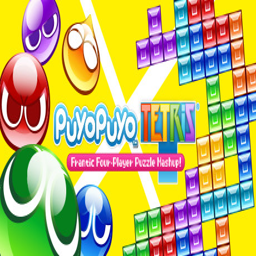

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP1 게임의 ID: 366240, title: GAROU: MARK OF THE WOLVES, Score: 0.723267674446106
선택된 게임의 content: “GAROU: MARK OF THE WOLVES”, the latest entry in the legendary "FATAL FURY" Series which still continues to fascinate players around the world to this day, returns for a new fight on Steam!
선택된 게임의 genres: ['Action', '2D Fighter', 'Arcade', 'Fighting', 'Competitive', 'Anime']


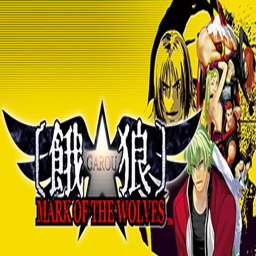

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP2 게임의 ID: 785260, title: Team Sonic Racing™, Score: 0.7229896783828735
선택된 게임의 content: Team Sonic Racing combines the best elements of arcade and fast-paced competitive style racing as you face-off with friends in intense multiplayer racing.
선택된 게임의 genres: ['Racing', 'Multiplayer', 'Great Soundtrack', 'Team-Based', 'Fast-Paced', 'Co-op', 'Arcade', 'Local Multiplayer', 'Local Co-Op', 'Action', 'Singleplayer', 'Colorful', 'Split Screen', 'Adventure', 'Family Friendly', 'Online Co-Op', 'Funny', 'Anime', 'Casual', 'Memes']


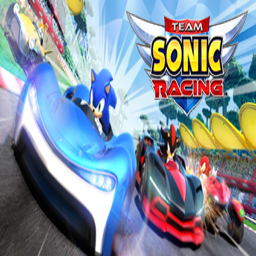

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP3 게임의 ID: 268910, title: Cuphead, Score: 0.7212883234024048
선택된 게임의 content: Cuphead is a classic run and gun action game heavily focused on boss battles. Inspired by cartoons of the 1930s, the visuals and audio are painstakingly created with the same techniques of the era, i.e. traditional hand drawn cel animation, watercolor backgrounds, and original jazz recordings.
선택된 게임의 genres: ['Difficult', 'Cartoon', 'Platformer', 'Great Soundtrack', 'Co-op', 'Local Co-Op', 'Hand-drawn', '2D', 'Indie', 'Retro', 'Multiplayer', 'Cartoony', 'Bullet Hell', 'Action', "Shoot 'Em Up", 'Side Scroller', 'Colorful', 'Singleplayer', 'Funny', 'Atmospheric']


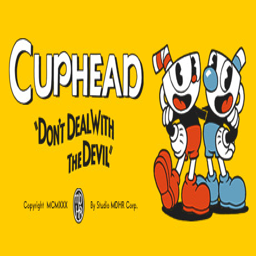

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP4 게임의 ID: 708880, title: BlazBlue Centralfiction - Additional Playable Character JUBEI, Score: 0.7121352553367615
선택된 게임의 content: This content requires the base game BlazBlue Centralfiction on Steam in order to play.
선택된 게임의 genres: ['Action']


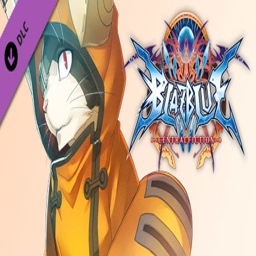

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP5 게임의 ID: 584400, title: Sonic Mania, Score: 0.71135014295578
선택된 게임의 content: Sonic Mania is an all-new adventure with Sonic, Tails, and Knuckles full of unique bosses, rolling 2D landscapes, and fun classic gameplay.
선택된 게임의 genres: ['Great Soundtrack', '2D', 'Platformer', 'Retro', 'Classic', 'Pixel Graphics', 'Fast-Paced', 'Colorful', 'Adventure', 'Action', 'Side Scroller', 'Singleplayer', 'Family Friendly', 'Casual', 'Local Co-Op', 'Multiplayer', 'Arcade', 'Action-Adventure', 'Cartoony', 'Remake']


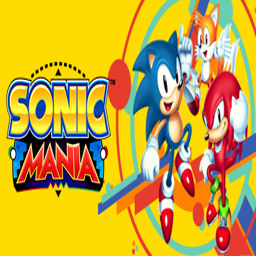

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP6 게임의 ID: 441770, title: MindTex 2, Score: 0.7071104049682617
선택된 게임의 content: MindTex is a normal map generation utility for game developers and 3d professionals. Whether you want to generate a normal, height, specular, gloss, self-illumination, occlusion, or reflection map, you can easily do it in seconds flat from a single source texture with MindTex.
선택된 게임의 genres: ['Animation & Modeling', 'Design & Illustration', 'Photo Editing']


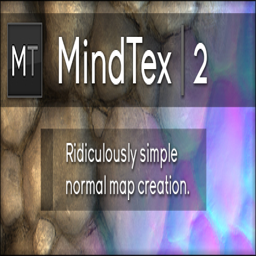

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP7 게임의 ID: 250760, title: Shovel Knight: Treasure Trove, Score: 0.7054874897003174
선택된 게임의 content: Shovel Knight: Treasure Trove is the complete Shovel Knight collection, containing all 5 games in the epic saga! Dig, blast, slash, and bash your way through a fantastical, 8-bit inspired world of pixel-perfect platforming, memorable characters, and world-class action-adventure gameplay.
선택된 게임의 genres: ['Platformer', 'Pixel Graphics', 'Retro', 'Great Soundtrack', 'Indie', '2D', 'Adventure', 'Action', 'Singleplayer', 'Difficult', 'Side Scroller', 'Kickstarter', 'Fantasy', 'Old School', 'Medieval', 'Funny', 'Comedy', 'Arcade', 'RPG', 'Metroidvania']


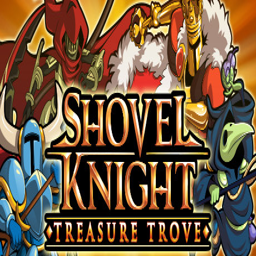

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP8 게임의 ID: 1147940, title: 3dSen PC, Score: 0.702962338924408
선택된 게임의 content: 3dSen PC breathes new life into your favorite NES games by magically converting them into 3D and letting you play them in real-time.
선택된 게임의 genres: ['Action', 'Adventure', 'RPG', 'Casual', 'Retro', "1990's", '2D', 'Platformer', 'Arcade', 'Pixel Graphics', 'Old School', 'Singleplayer', "Beat 'em up", 'Local Multiplayer', 'VR', '2.5D', 'Indie', 'Early Access', 'Classic', 'Great Soundtrack']


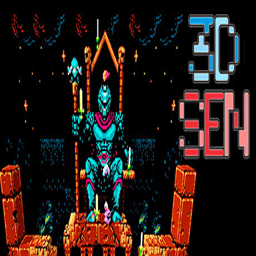

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP9 게임의 ID: 383980, title: Rivals of Aether, Score: 0.7008933424949646
선택된 게임의 content: RIVALS OF AETHER is an indie fighting game where warring civilizations summon the power of Fire, Water, Air, and Earth. Play with up to four players either locally or online.
선택된 게임의 genres: ['Fighting', '2D Fighter', 'Pixel Graphics', 'Multiplayer', 'Indie', 'Local Multiplayer', 'Competitive', 'Great Soundtrack', '2D', '4 Player Local', 'Platformer', 'Action', 'Games Workshop', 'Controller', 'Arcade', "Beat 'em up", 'Singleplayer', 'Early Access', 'Retro', 'GameMaker']


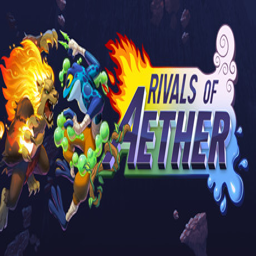

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP10 게임의 ID: 1472070, title: RetroArch, Score: 0.6998148560523987
선택된 게임의 content: RetroArch is an open source and cross platform frontend/framework for emulators, game engines, video games, media players and other applications
선택된 게임의 genres: ['Free to Play', 'Retro', 'Singleplayer', 'Multiplayer', 'Software', 'Simulation', 'Local Multiplayer']


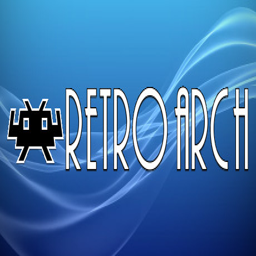

----------------------------------------------------------------------------------------------------


In [ ]:
# Puyo Puyo™Tetris®
get_sim_game(rec_yes_shuffle_yes_model, '546050')

----------------------------------------------------------------------------------------------------
선택된 게임의 ID: 960170, 선택된 게임의 title: DJMAX RESPECT V
선택된 게임의 content: DJMAX RESPECT V is the latest installment from the creators of the critically acclaimed rhythm game franchise ‘DJMAX.’ Experience tracks from popular artists such as Marshmello, Porter Robinson, and Yukika, exclusive Full HD Music Videos, online multiplayer, new game modes, and more!
선택된 게임의 genres: ['Casual', 'Rhythm', 'Action', 'Sports', 'Music', 'Great Soundtrack', 'Anime', 'Multiplayer', 'Early Access', 'Singleplayer', 'Competitive', 'Difficult', 'Arcade']


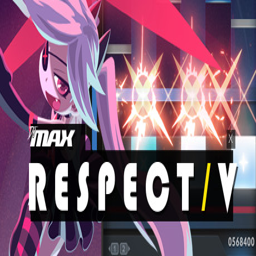

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP1 게임의 ID: 744060, title: Groove Coaster, Score: 0.7899699807167053
선택된 게임의 content: Riding the rhythmic rails of success from smart phone, into the arcades, now GROOVE COASTER arrives on Steam! Are you ready to ride a roller coaster of sound and light through a universe of music?
선택된 게임의 genres: ['Action', 'Rhythm', 'Music', 'Arcade', 'Great Soundtrack', 'Anime', 'Singleplayer', 'Difficult']


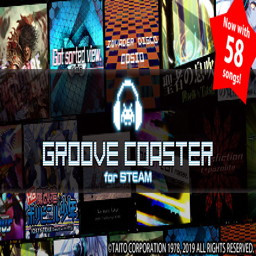

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP2 게임의 ID: 661990, title: Arcana Heart 3 LOVEMAX SIXSTARS!!!!!! XTEND, Score: 0.7780786752700806
선택된 게임의 content: New playable character "Minori Amanohara" and new Arcana "Ichor" the Blood joins the battle in "Arcana Heart 3 LOVEMAX SIXSTARS!!!!!!"! More new characters to join in future updates!
선택된 게임의 genres: ['Action', 'Fighting', 'Anime', '2D Fighter', 'Arcade', 'Cute', 'Singleplayer', 'Local Multiplayer', 'eSports', 'Kickstarter', 'Controller', 'Crowdfunded', 'Fantasy', '2D', 'Female Protagonist']


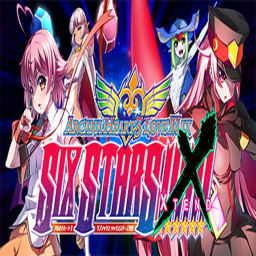

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP3 게임의 ID: 801630, title: UNDER NIGHT IN-BIRTH Exe:Late[cl-r], Score: 0.7693824172019958
선택된 게임의 content: Pick one of 20 unique characters and fight your way through the dangers of the “Hollow Night”, and claim your victory over those who would get in your way. Experience intuitive and tight 2D fighter controls, with a splash of devastating combos and unique fighting styles to keep your appetite for battle sated!
선택된 게임의 genres: ['2D Fighter', 'Action', 'Fighting', 'Anime', 'Great Soundtrack', 'Competitive', 'Local Multiplayer', 'Visual Novel', 'Tutorial', 'Controller', 'Story Rich', 'Singleplayer', 'eSports', 'Pixel Graphics', 'Difficult', 'Cute', 'Fantasy', 'Soundtrack']


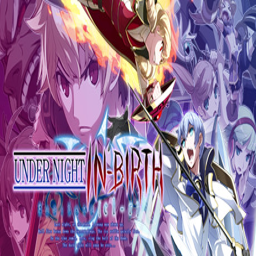

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP4 게임의 ID: 520440, title: GUILTY GEAR Xrd -REVELATOR-, Score: 0.7682417035102844
선택된 게임의 content: Astonishing 3D cell animations and overwhelming content volume, the next-generation fighting game "GUILTY GEAR Xrd -REVELATOR-" is now out on Steam! Total cast of 23 unique characters, and tons of game modes, get ready to ROCK!
선택된 게임의 genres: ['Fighting', 'Anime', '2D Fighter', 'Great Soundtrack', 'Action', 'Multiplayer', '2.5D', 'Local Multiplayer', 'Difficult', 'Story Rich', 'Arcade', 'Controller', 'Competitive', 'eSports', 'Singleplayer', 'Tutorial', '2D', 'Cute', 'God Game', 'Visual Novel']


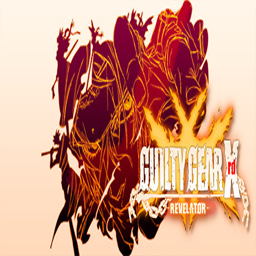

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP5 게임의 ID: 909670, title: Skybolt Zack, Score: 0.7620935440063477
선택된 게임의 content: Skybolt Zack is a brand new fast-paced arcade gaming experience! With his Rocket Punches Zack leaps from enemy to enemy, destroying anything standing in his way! Match the colour of the enemies with the buttons on the gamepad to rid the world of Dr Kaz’s robot army!
선택된 게임의 genres: ['Side Scroller', 'Platformer', 'Runner', 'Rhythm', 'Difficult', 'Fast-Paced', 'Retro', 'Arcade', 'Action-Adventure', 'Action', 'Anime', 'Colorful', 'Score Attack', 'Time Attack', '2D', 'Robots', 'Singleplayer', 'Controller', 'Soundtrack', 'Indie']


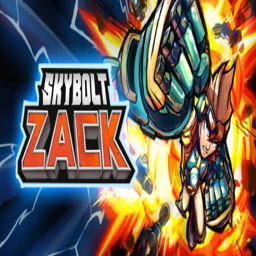

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP6 게임의 ID: 1062830, title: Embr, Score: 0.7314124703407288
선택된 게임의 content: Embr is a frantic firefighting game set in a hyper-capitalist reality where traditional emergency services are a thing of the past. Scale buildings, smash windows, fight fires and save lives either solo or co-op in up to teams of four. Embr is the last stand in a world ablaze.
선택된 게임의 genres: ['Indie', 'Action', 'Simulation', 'Early Access', 'Singleplayer', 'Co-op Campaign', 'Puzzle', 'Multiplayer', 'Funny', 'First-Person', 'Puzzle Platformer', 'Co-op', 'Replay Value', 'Online Co-Op', 'Controller', 'Colorful', 'Character Customization', 'Cartoony', 'Stylized', '3D']


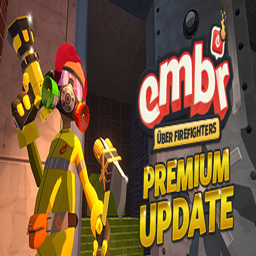

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP7 게임의 ID: 1158940, title: Blazing Sails, Score: 0.7262603044509888
선택된 게임의 content: Fight for survival in Blazing Sails, a fast-paced pirate PvP game! Create your own unique pirate and ship. Band together with other players to command your mighty vessel! Navigate land and sea for loot, resources, unique weapons and ship upgrades. Sink every other ship to win the skirmish!
선택된 게임의 genres: ['Early Access', 'Co-op', 'Naval Combat', 'Online Co-Op', 'Character Customization', 'FPS', 'Pirates', 'Historical', 'Open World', 'PvP', 'Fast-Paced', 'First-Person', 'Battle Royale', 'Survival', 'Team-Based', 'Competitive', 'Funny', 'Shooter', 'Action', 'Naval']


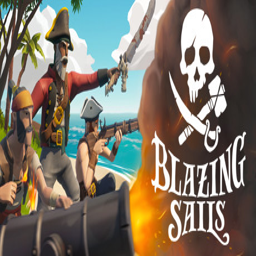

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP8 게임의 ID: 411370, title: Melty Blood Actress Again Current Code, Score: 0.7235863208770752
선택된 게임의 content: The final episode of the series, "MELTY BLOOD Actress Again Current Code" is now on Steam!
선택된 게임의 genres: ['Anime', '2D Fighter', 'Fighting', 'Action', 'Great Soundtrack', 'Arcade', 'Local Multiplayer', 'Difficult', 'Cute', 'eSports', 'Visual Novel', 'Controller', 'Story Rich', 'Multiplayer', '2D', 'Vampire']


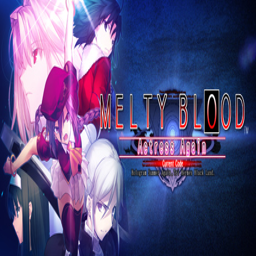

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP9 게임의 ID: 1247020, title: Lovingly Evil, Score: 0.7220848202705383
선택된 게임의 content: Unleash your inner villain and head over to the Villain Conference, the one and only interdimensional business event for evildoers! Who knows, maybe you'll even find a partner - whether it's in crime or love…
선택된 게임의 genres: ['Romance', 'Visual Novel', 'Character Customization', 'Comedy', 'Cute', 'Indie', 'Casual', 'Puzzle', 'Colorful', 'LGBTQ', 'Story Rich', 'Memes', 'Funny', 'Dating Sim', 'Multiple Endings', 'Singleplayer', '2D', 'Anime', 'Choices Matter']


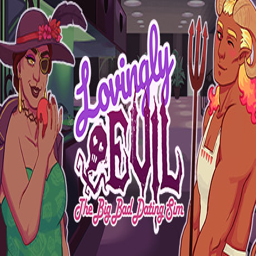

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP10 게임의 ID: 921630, title: 音灵 INVAXION, Score: 0.7218155860900879
선택된 게임의 content: Classic music gameplay with a whole new game experience! Players will play as a member of the mercenary army, ”INVAXION”, head into an interstellar journey to collect the fragment of music and art while fighting back with the Artificial Intelligence to save the day.
선택된 게임의 genres: ['Music', 'Rhythm', 'Casual', 'Indie', 'Anime', 'Racing']


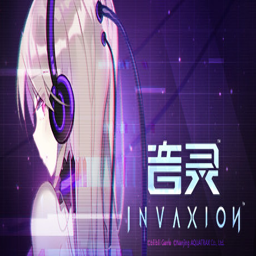

----------------------------------------------------------------------------------------------------


In [ ]:
# DJMAX RESPECT V
get_sim_game(rec_yes_shuffle_yes_model, '960170')

----------------------------------------------------------------------------------------------------
선택된 게임의 ID: 7670, 선택된 게임의 title: BioShock™
선택된 게임의 content: BioShock is a shooter unlike any you've ever played, loaded with weapons and tactics never seen. You'll have a complete arsenal at your disposal from simple revolvers to grenade launchers and chemical throwers, but you'll also be forced to genetically modify your DNA to create an even more deadly weapon: you.
선택된 게임의 genres: ['FPS', 'Atmospheric', 'Story Rich', 'Action', 'Singleplayer', 'Horror', 'Steampunk', 'First-Person', 'Shooter', 'Sci-fi', 'RPG', 'Classic', 'Adventure', 'Dystopian ', 'Underwater', 'Immersive', 'Dark', 'Political', 'Great Soundtrack', 'Alternate History']


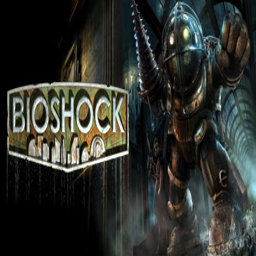

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP1 게임의 ID: 8850, title: BioShock® 2, Score: 0.8560726046562195
선택된 게임의 content: Set approximately 10 years after the events of the original BioShock, the halls of Rapture once again echo with sins of the past. Along the Atlantic coastline, a monster has been snatching little girls and bringing them back to the undersea city of Rapture.
선택된 게임의 genres: ['FPS', 'Action', 'Singleplayer', 'Atmospheric', 'Story Rich', 'Horror', 'Shooter', 'First-Person', 'Steampunk', 'Sci-fi', 'Multiplayer', 'Dystopian ', 'Underwater', 'Adventure', 'RPG', 'Immersive', 'Dark', 'Great Soundtrack', 'Philosophical', 'Action RPG']


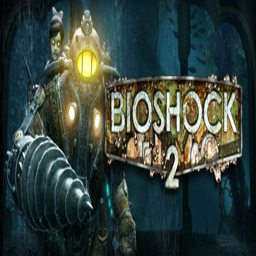

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP2 게임의 ID: 70, title: Half-Life, Score: 0.8372997045516968
선택된 게임의 content: Named Game of the Year by over 50 publications, Valve's debut title blends action and adventure with award-winning technology to create a frighteningly realistic world where players must think to survive. Also includes an exciting multiplayer mode that allows you to play against friends and enemies around the world.
선택된 게임의 genres: ['FPS', 'Action', 'Sci-fi', 'Singleplayer', 'Multiplayer', "1990's", 'Shooter', 'First-Person', 'Story Rich', 'Aliens', 'Silent Protagonist', 'Atmospheric', 'Adventure', 'Moddable', 'Action-Adventure', 'Retro', 'Classic', 'PvP', 'Gore', 'Difficult']


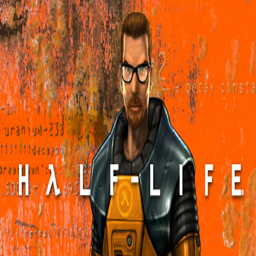

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP3 게임의 ID: 8870, title: BioShock Infinite, Score: 0.8353829383850098
선택된 게임의 content: Indebted to the wrong people, with his life on the line, veteran of the U.S. Cavalry and now hired gun, Booker DeWitt has only one opportunity to wipe his slate clean. He must rescue Elizabeth, a mysterious girl imprisoned since childhood and locked up in the flying city of Columbia.
선택된 게임의 genres: ['FPS', 'Story Rich', 'Action', 'Singleplayer', 'Steampunk', 'Atmospheric', 'Shooter', 'First-Person', 'Alternate History', 'Beautiful', 'Adventure', 'Great Soundtrack', 'Dystopian ', 'Sci-fi', 'Time Travel', 'Fantasy', 'Gore', 'Linear', 'RPG', 'Immersive']


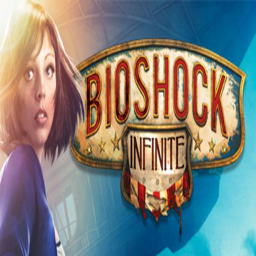

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP4 게임의 ID: 17470, title: Dead Space, Score: 0.831858217716217
선택된 게임의 content: You are Isaac Clarke, an engineer on the spacecraft USG Ishimura. You're not a warrior. You're not a soldier. You are, however, the last line of defense for the remaining living crew.
선택된 게임의 genres: ['Horror', 'Sci-fi', 'Action', 'Space', 'Third Person', 'Survival Horror', 'Atmospheric', 'Singleplayer', 'Third-Person Shooter', 'Gore', 'Shooter', 'Aliens', 'Dark', 'Futuristic', 'Story Rich', 'Silent Protagonist', 'Survival', 'Adventure', 'Zombies', 'Immersive']


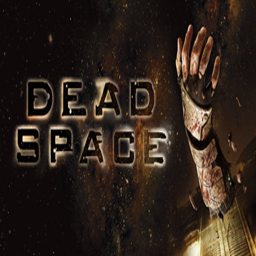

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP5 게임의 ID: 35140, title: Batman: Arkham Asylum Game of the Year Edition, Score: 0.8309833407402039
선택된 게임의 content: Experience what it’s like to be Batman and face off against Gotham's greatest villians. Explore every inch of Arkham Asylum and roam freely on the infamous island.
선택된 게임의 genres: ['Action', 'Stealth', 'Third Person', 'Superhero', 'Adventure', 'Singleplayer', 'Open World', "Beat 'em up", 'Detective', 'Comic Book', 'Atmospheric', 'Story Rich', 'Action-Adventure', 'Fighting', 'Controller', 'Metroidvania', 'Puzzle', '3D Vision', 'Horror', 'Dark']


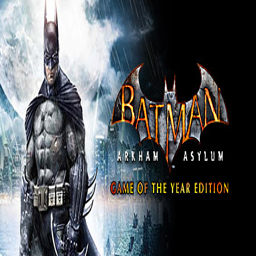

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP6 게임의 ID: 16450, title: F.E.A.R. 2: Project Origin, Score: 0.8158693313598633
선택된 게임의 content: Assume the role of Special Forces Sgt. Becket as your routine mission quickly turns into a fight for survival against the wrath of Alma Wade. As Alma's terrifying power surges out of control, your squad is forced to battle through an apocalyptic landscape in search of clues for how to destroy her!
선택된 게임의 genres: ['Horror', 'FPS', 'Action', 'Singleplayer', 'Shooter', 'Gore', 'Psychological Horror', 'Bullet Time', 'First-Person', 'Multiplayer', 'Atmospheric', 'Co-op', 'Sci-fi', 'Classic', 'Story Rich', 'Sequel', 'Mechs', 'Nudity', 'Survival Horror', 'Open World']


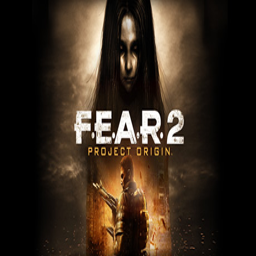

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP7 게임의 ID: 400, title: Portal, Score: 0.8146346211433411
선택된 게임의 content: Portal™ is a new single player game from Valve. Set in the mysterious Aperture Science Laboratories, Portal has been called one of the most innovative new games on the horizon and will offer gamers hours of unique gameplay.
선택된 게임의 genres: ['Puzzle', 'Puzzle Platformer', '3D Platformer', 'First-Person', 'Singleplayer', 'Sci-fi', 'Comedy', 'Female Protagonist', 'Action', 'Funny', 'Physics', 'Story Rich', 'Classic', 'Platformer', 'Science', 'FPS', 'Atmospheric', 'Short', 'Adventure', 'Dark Humor']


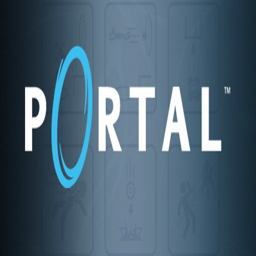

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP8 게임의 ID: 17410, title: Mirror's Edge™, Score: 0.8143896460533142
선택된 게임의 content: In a city where information is heavily monitored, couriers called Runners transport sensitive data. In this seemingly utopian paradise, a crime has been committed, & you are being hunted. You are a Runner called Faith and this innovative first-person action-adventure is your story.
선택된 게임의 genres: ['Parkour', 'First-Person', 'Action', 'Female Protagonist', 'Singleplayer', 'Great Soundtrack', 'Adventure', 'Platformer', 'Atmospheric', 'Dystopian ', 'Stylized', 'Futuristic', 'Sci-fi', 'FPS', 'Cyberpunk', 'Colorful', 'Puzzle', 'Time Attack', 'Classic', 'Short']


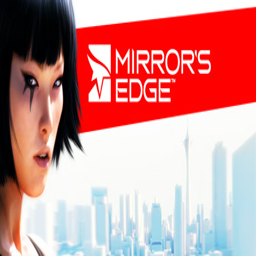

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP9 게임의 ID: 620, title: Portal 2, Score: 0.8122760653495789
선택된 게임의 content: The "Perpetual Testing Initiative" has been expanded to allow you to design co-op puzzles for you and your friends!
선택된 게임의 genres: ['Platformer', 'Dark Humor', 'Puzzle', 'Puzzle Platformer', 'First-Person', 'Story Rich', 'Female Protagonist', 'Funny', '3D Platformer', 'Action-Adventure', 'FPS', 'Action', 'Co-op', 'Physics', 'Level Editor', 'Sci-fi', 'Science', 'Atmospheric', 'Comedy', 'Adventure']


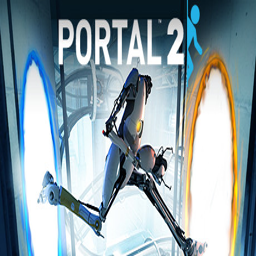

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP10 게임의 ID: 50, title: Half-Life: Opposing Force, Score: 0.8107323050498962
선택된 게임의 content: Return to the Black Mesa Research Facility as one of the military specialists assigned to eliminate Gordon Freeman. Experience an entirely new episode of single player action. Meet fierce alien opponents, and experiment with new weaponry. Named 'Game of the Year' by the Academy of Interactive Arts and Sciences.
선택된 게임의 genres: ['FPS', 'Action', 'Classic', 'Sci-fi', 'Singleplayer', 'Shooter', 'First-Person', 'Aliens', "1990's", 'Adventure', 'Atmospheric', 'Military', 'Story Rich', 'Silent Protagonist', 'Great Soundtrack', 'Gore', 'Puzzle', 'Co-op', 'Moddable', 'Retro']


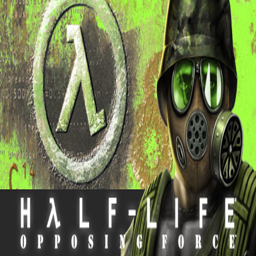

----------------------------------------------------------------------------------------------------


In [ ]:
# BioShock™
get_sim_game(rec_yes_shuffle_yes_model, '7670')

## 선호도 구분 데이터 O / 셔플 X 모델

In [ ]:
from gensim.models import Word2Vec
import datetime

start = datetime.datetime.now()

rec_yes_shuffle_no_model = Word2Vec(sentences = rec_yes_shuffle_no_user_play_game_li,
                        iter = 10,
                        min_count = 5,
                        size = 300,
                        workers = 4,
                        sg = 1,
                        hs = 0,
                        negative = 5,
                        window = 9999999)

rec_yes_shuffle_no_model.wv.save_word2vec_format(DATA_DIR + 'rec_yes_shuffle_no_model') # 모델 저장

print("Time passed: " + str(datetime.datetime.now() - start))

Time passed: 0:32:34.208871


----------------------------------------------------------------------------------------------------
선택된 게임의 ID: 7670, 선택된 게임의 title: BioShock™
선택된 게임의 content: BioShock is a shooter unlike any you've ever played, loaded with weapons and tactics never seen. You'll have a complete arsenal at your disposal from simple revolvers to grenade launchers and chemical throwers, but you'll also be forced to genetically modify your DNA to create an even more deadly weapon: you.
선택된 게임의 genres: ['FPS', 'Atmospheric', 'Story Rich', 'Action', 'Singleplayer', 'Horror', 'Steampunk', 'First-Person', 'Shooter', 'Sci-fi', 'RPG', 'Classic', 'Adventure', 'Dystopian ', 'Underwater', 'Immersive', 'Dark', 'Political', 'Great Soundtrack', 'Alternate History']


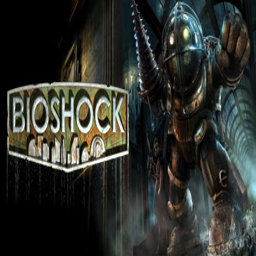

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP1 게임의 ID: 8850, title: BioShock® 2, Score: 0.8413135409355164
선택된 게임의 content: Set approximately 10 years after the events of the original BioShock, the halls of Rapture once again echo with sins of the past. Along the Atlantic coastline, a monster has been snatching little girls and bringing them back to the undersea city of Rapture.
선택된 게임의 genres: ['FPS', 'Action', 'Singleplayer', 'Atmospheric', 'Story Rich', 'Horror', 'Shooter', 'First-Person', 'Steampunk', 'Sci-fi', 'Multiplayer', 'Dystopian ', 'Underwater', 'Adventure', 'RPG', 'Immersive', 'Dark', 'Great Soundtrack', 'Philosophical', 'Action RPG']


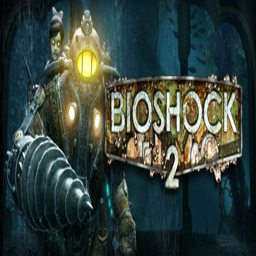

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP2 게임의 ID: 17470, title: Dead Space, Score: 0.8310210704803467
선택된 게임의 content: You are Isaac Clarke, an engineer on the spacecraft USG Ishimura. You're not a warrior. You're not a soldier. You are, however, the last line of defense for the remaining living crew.
선택된 게임의 genres: ['Horror', 'Sci-fi', 'Action', 'Space', 'Third Person', 'Survival Horror', 'Atmospheric', 'Singleplayer', 'Third-Person Shooter', 'Gore', 'Shooter', 'Aliens', 'Dark', 'Futuristic', 'Story Rich', 'Silent Protagonist', 'Survival', 'Adventure', 'Zombies', 'Immersive']


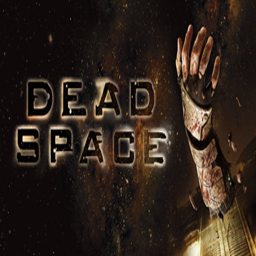

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP3 게임의 ID: 35140, title: Batman: Arkham Asylum Game of the Year Edition, Score: 0.8296428918838501
선택된 게임의 content: Experience what it’s like to be Batman and face off against Gotham's greatest villians. Explore every inch of Arkham Asylum and roam freely on the infamous island.
선택된 게임의 genres: ['Action', 'Stealth', 'Third Person', 'Superhero', 'Adventure', 'Singleplayer', 'Open World', "Beat 'em up", 'Detective', 'Comic Book', 'Atmospheric', 'Story Rich', 'Action-Adventure', 'Fighting', 'Controller', 'Metroidvania', 'Puzzle', '3D Vision', 'Horror', 'Dark']


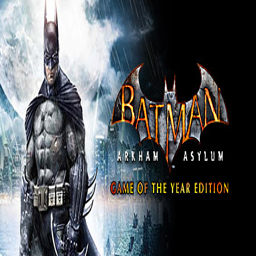

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP4 게임의 ID: 8870, title: BioShock Infinite, Score: 0.8244252800941467
선택된 게임의 content: Indebted to the wrong people, with his life on the line, veteran of the U.S. Cavalry and now hired gun, Booker DeWitt has only one opportunity to wipe his slate clean. He must rescue Elizabeth, a mysterious girl imprisoned since childhood and locked up in the flying city of Columbia.
선택된 게임의 genres: ['FPS', 'Story Rich', 'Action', 'Singleplayer', 'Steampunk', 'Atmospheric', 'Shooter', 'First-Person', 'Alternate History', 'Beautiful', 'Adventure', 'Great Soundtrack', 'Dystopian ', 'Sci-fi', 'Time Travel', 'Fantasy', 'Gore', 'Linear', 'RPG', 'Immersive']


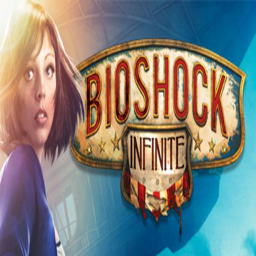

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP5 게임의 ID: 8980, title: Borderlands Game of the Year, Score: 0.7994725108146667
선택된 게임의 content: Get ready for the mind blowing insanity! Play as one of four trigger-happy mercenaries and take out everything that stands in your way! With its addictive action, frantic first-person shooter combat, massive arsenal of weaponry, RPG elements and four-player co-op, Borderlands is a breakthrough experience that challenges all the...
선택된 게임의 genres: ['Looter Shooter', 'FPS', 'Co-op', 'RPG', 'Action', 'Loot', 'Shooter', 'Online Co-Op', 'First-Person', 'Open World', 'Comedy', 'Multiplayer', 'Sci-fi', 'Post-apocalyptic', 'Singleplayer', 'Action RPG', 'Funny', 'Dark Humor', 'Adventure', 'Gore']


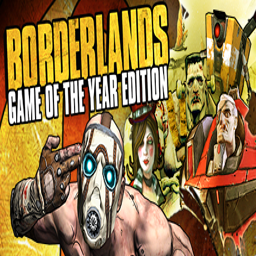

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP6 게임의 ID: 420, title: Half-Life 2: Episode Two, Score: 0.7976633906364441
선택된 게임의 content: Half-Life® 2: Episode Two is the second in a trilogy of new games created by Valve that extends the award-winning and best-selling Half-Life® adventure. As Dr. Gordon Freeman, you were last seen exiting City 17 with Alyx Vance as the Citadel erupted amidst a storm of unknown proportions.
선택된 게임의 genres: ['FPS', 'Action', 'Sci-fi', 'Singleplayer', 'Shooter', 'Story Rich', 'First-Person', 'Classic', 'Adventure', 'Aliens', 'Atmospheric', 'Zombies', 'Silent Protagonist', 'Great Soundtrack', 'Dystopian ', 'Post-apocalyptic', 'Episodic', 'Puzzle', 'Horror', 'Multiplayer']


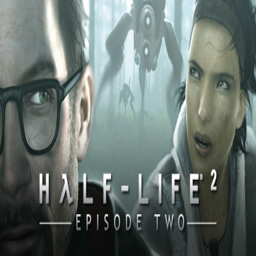

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP7 게임의 ID: 409710, title: BioShock™ Remastered, Score: 0.7954566478729248
선택된 게임의 content: BioShock is a shooter unlike any other, loaded with unique weapons and tactics. Complete with an arsenal of revolvers, shotguns, and grenade launchers, players will be forced to genetically modify their DNA to become an even deadlier weapon.
선택된 게임의 genres: ['FPS', 'Story Rich', 'Atmospheric', 'Singleplayer', 'Horror', 'First-Person', 'Action', 'Shooter', 'Dystopian ', 'Underwater', 'Sci-fi', 'Steampunk', 'Dark', 'RPG', 'Remake', 'Adventure', 'Classic', 'Great Soundtrack', 'Alternate History', 'Choices Matter']


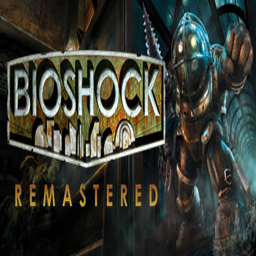

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP8 게임의 ID: 108710, title: Alan Wake, Score: 0.7935245633125305
선택된 게임의 content: A Dark Presence stalks the small town of Bright Falls, pushing Alan Wake to the brink of sanity in his fight to unravel the mystery and save his love.
선택된 게임의 genres: ['Action', 'Horror', 'Adventure', 'Third Person', 'Story Rich', 'Thriller', 'Atmospheric', 'Singleplayer', 'Psychological Horror', 'Great Soundtrack', 'Mystery', 'Episodic', 'Third-Person Shooter', 'Dark', 'Supernatural', 'Cinematic', 'Narration', 'Survival Horror', 'Shooter', 'Survival']


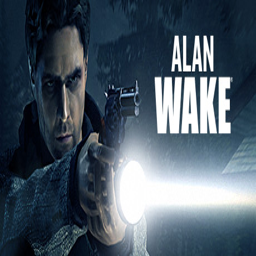

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP9 게임의 ID: 400, title: Portal, Score: 0.7931694984436035
선택된 게임의 content: Portal™ is a new single player game from Valve. Set in the mysterious Aperture Science Laboratories, Portal has been called one of the most innovative new games on the horizon and will offer gamers hours of unique gameplay.
선택된 게임의 genres: ['Puzzle', 'Puzzle Platformer', '3D Platformer', 'First-Person', 'Singleplayer', 'Sci-fi', 'Comedy', 'Female Protagonist', 'Action', 'Funny', 'Physics', 'Story Rich', 'Classic', 'Platformer', 'Science', 'FPS', 'Atmospheric', 'Short', 'Adventure', 'Dark Humor']


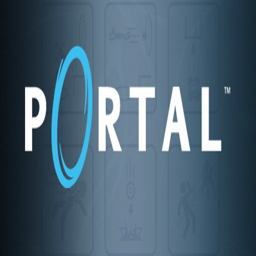

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP10 게임의 ID: 17410, title: Mirror's Edge™, Score: 0.7915135622024536
선택된 게임의 content: In a city where information is heavily monitored, couriers called Runners transport sensitive data. In this seemingly utopian paradise, a crime has been committed, & you are being hunted. You are a Runner called Faith and this innovative first-person action-adventure is your story.
선택된 게임의 genres: ['Parkour', 'First-Person', 'Action', 'Female Protagonist', 'Singleplayer', 'Great Soundtrack', 'Adventure', 'Platformer', 'Atmospheric', 'Dystopian ', 'Stylized', 'Futuristic', 'Sci-fi', 'FPS', 'Cyberpunk', 'Colorful', 'Puzzle', 'Time Attack', 'Classic', 'Short']


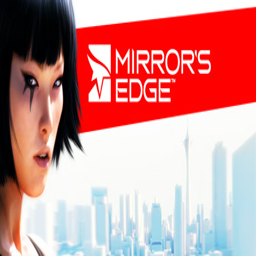

----------------------------------------------------------------------------------------------------


In [ ]:
# BioShock™
get_sim_game(rec_yes_shuffle_no_model, '7670')

## 선호도 구분 데이터 X / 셔플 O 모델

In [ ]:
from gensim.models import Word2Vec
import datetime

start = datetime.datetime.now()

rec_no_shuffle_yes_model = Word2Vec(sentences = rec_no_shuffle_yes_user_play_game_li,
                        iter = 10,
                        min_count = 5,
                        size = 300,
                        workers = 4,
                        sg = 1,
                        hs = 0,
                        negative = 5,
                        window = 9999999)

rec_no_shuffle_yes_model.wv.save_word2vec_format(DATA_DIR + 'rec_no_shuffle_yes_model') # 모델 저장

print("Time passed: " + str(datetime.datetime.now() - start))

Time passed: 0:45:48.535327


----------------------------------------------------------------------------------------------------
선택된 게임의 ID: 7670, 선택된 게임의 title: BioShock™
선택된 게임의 content: BioShock is a shooter unlike any you've ever played, loaded with weapons and tactics never seen. You'll have a complete arsenal at your disposal from simple revolvers to grenade launchers and chemical throwers, but you'll also be forced to genetically modify your DNA to create an even more deadly weapon: you.
선택된 게임의 genres: ['FPS', 'Atmospheric', 'Story Rich', 'Action', 'Singleplayer', 'Horror', 'Steampunk', 'First-Person', 'Shooter', 'Sci-fi', 'RPG', 'Classic', 'Adventure', 'Dystopian ', 'Underwater', 'Immersive', 'Dark', 'Political', 'Great Soundtrack', 'Alternate History']


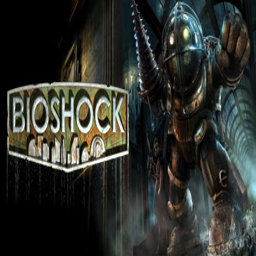

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP1 게임의 ID: 8850, title: BioShock® 2, Score: 0.8882818818092346
선택된 게임의 content: Set approximately 10 years after the events of the original BioShock, the halls of Rapture once again echo with sins of the past. Along the Atlantic coastline, a monster has been snatching little girls and bringing them back to the undersea city of Rapture.
선택된 게임의 genres: ['FPS', 'Action', 'Singleplayer', 'Atmospheric', 'Story Rich', 'Horror', 'Shooter', 'First-Person', 'Steampunk', 'Sci-fi', 'Multiplayer', 'Dystopian ', 'Underwater', 'Adventure', 'RPG', 'Immersive', 'Dark', 'Great Soundtrack', 'Philosophical', 'Action RPG']


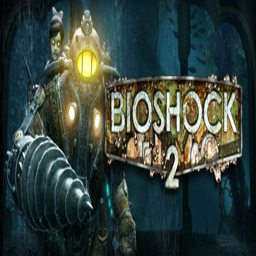

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP2 게임의 ID: 8870, title: BioShock Infinite, Score: 0.8720734119415283
선택된 게임의 content: Indebted to the wrong people, with his life on the line, veteran of the U.S. Cavalry and now hired gun, Booker DeWitt has only one opportunity to wipe his slate clean. He must rescue Elizabeth, a mysterious girl imprisoned since childhood and locked up in the flying city of Columbia.
선택된 게임의 genres: ['FPS', 'Story Rich', 'Action', 'Singleplayer', 'Steampunk', 'Atmospheric', 'Shooter', 'First-Person', 'Alternate History', 'Beautiful', 'Adventure', 'Great Soundtrack', 'Dystopian ', 'Sci-fi', 'Time Travel', 'Fantasy', 'Gore', 'Linear', 'RPG', 'Immersive']


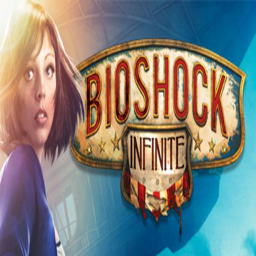

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP3 게임의 ID: 35140, title: Batman: Arkham Asylum Game of the Year Edition, Score: 0.8669675588607788
선택된 게임의 content: Experience what it’s like to be Batman and face off against Gotham's greatest villians. Explore every inch of Arkham Asylum and roam freely on the infamous island.
선택된 게임의 genres: ['Action', 'Stealth', 'Third Person', 'Superhero', 'Adventure', 'Singleplayer', 'Open World', "Beat 'em up", 'Detective', 'Comic Book', 'Atmospheric', 'Story Rich', 'Action-Adventure', 'Fighting', 'Controller', 'Metroidvania', 'Puzzle', '3D Vision', 'Horror', 'Dark']


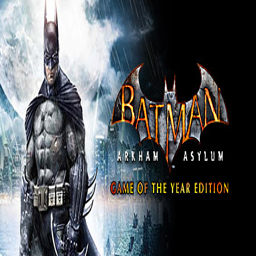

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP4 게임의 ID: 57300, title: Amnesia: The Dark Descent, Score: 0.8476659655570984
선택된 게임의 content: Amnesia: The Dark Descent, a first person survival horror. A game about immersion, discovery and living through a nightmare. An experience that will chill you to the core.
선택된 게임의 genres: ['Horror', 'Survival Horror', 'Atmospheric', 'Psychological Horror', 'Story Rich', 'First-Person', 'Adventure', 'Dark', 'Indie', 'Survival', 'Physics', 'Stealth', 'Puzzle', 'Singleplayer', 'Gore', 'Action', 'Exploration', 'Lovecraftian', 'Gothic', 'Great Soundtrack']


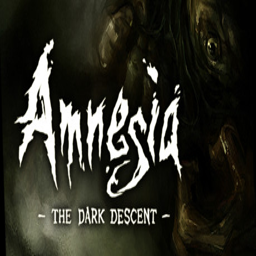

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP5 게임의 ID: 8980, title: Borderlands Game of the Year, Score: 0.8472427725791931
선택된 게임의 content: Get ready for the mind blowing insanity! Play as one of four trigger-happy mercenaries and take out everything that stands in your way! With its addictive action, frantic first-person shooter combat, massive arsenal of weaponry, RPG elements and four-player co-op, Borderlands is a breakthrough experience that challenges all the...
선택된 게임의 genres: ['Looter Shooter', 'FPS', 'Co-op', 'RPG', 'Action', 'Loot', 'Shooter', 'Online Co-Op', 'First-Person', 'Open World', 'Comedy', 'Multiplayer', 'Sci-fi', 'Post-apocalyptic', 'Singleplayer', 'Action RPG', 'Funny', 'Dark Humor', 'Adventure', 'Gore']


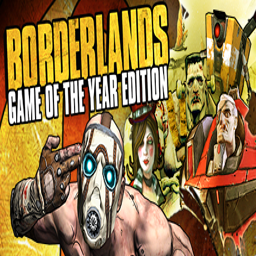

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP6 게임의 ID: 48000, title: LIMBO, Score: 0.845158576965332
선택된 게임의 content: Uncertain of his sister's fate, a boy enters LIMBO
선택된 게임의 genres: ['Puzzle Platformer', 'Indie', 'Puzzle', 'Platformer', 'Dark', 'Atmospheric', 'Adventure', '2D', 'Singleplayer', 'Horror', 'Surreal', 'Short', 'Side Scroller', 'Difficult', 'Minimalist', 'Physics', 'Action', 'Casual', 'Cinematic', 'Controller']


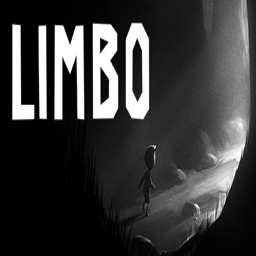

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP7 게임의 ID: 50300, title: Spec Ops: The Line, Score: 0.8438079357147217
선택된 게임의 content: A Third-Person modern military Shooter designed to challenge players' morality by putting them in the middle of unspeakable situations.
선택된 게임의 genres: ['Story Rich', 'Third-Person Shooter', 'Action', 'Psychological', 'Atmospheric', 'Singleplayer', 'War', 'Third Person', 'Shooter', 'Dark', 'Emotional', 'Multiplayer', 'Military', 'Adventure', 'Political', 'Mature', 'Great Soundtrack', 'Based On A Novel', 'Post-apocalyptic', 'Co-op']


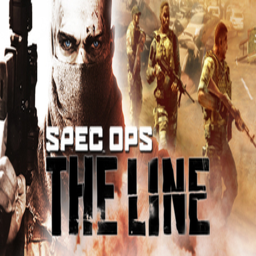

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP8 게임의 ID: 409710, title: BioShock™ Remastered, Score: 0.8417002558708191
선택된 게임의 content: BioShock is a shooter unlike any other, loaded with unique weapons and tactics. Complete with an arsenal of revolvers, shotguns, and grenade launchers, players will be forced to genetically modify their DNA to become an even deadlier weapon.
선택된 게임의 genres: ['FPS', 'Story Rich', 'Atmospheric', 'Singleplayer', 'Horror', 'First-Person', 'Action', 'Shooter', 'Dystopian ', 'Underwater', 'Sci-fi', 'Steampunk', 'Dark', 'RPG', 'Remake', 'Adventure', 'Classic', 'Great Soundtrack', 'Alternate History', 'Choices Matter']


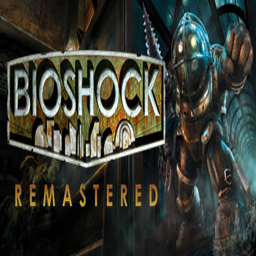

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP9 게임의 ID: 220, title: Half-Life 2, Score: 0.841432511806488
선택된 게임의 content: 1998. HALF-LIFE sends a shock through the game industry with its combination of pounding action and continuous, immersive storytelling. Valve's debut title wins more than 50 game-of-the-year awards on its way to being named "Best PC Game Ever" by PC Gamer, and launches a franchise with more than eight million retail units sold worldwide.
선택된 게임의 genres: ['FPS', 'Action', 'Sci-fi', 'Classic', 'Singleplayer', 'Story Rich', 'Shooter', 'First-Person', 'Adventure', 'Dystopian ', 'Atmospheric', 'Zombies', 'Silent Protagonist', 'Physics', 'Aliens', 'Great Soundtrack', 'Horror', 'Puzzle', 'Multiplayer', 'Moddable']


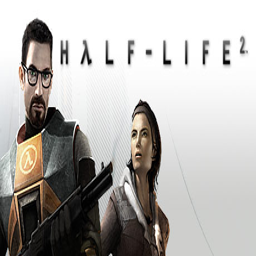

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP10 게임의 ID: 108710, title: Alan Wake, Score: 0.8385180234909058
선택된 게임의 content: A Dark Presence stalks the small town of Bright Falls, pushing Alan Wake to the brink of sanity in his fight to unravel the mystery and save his love.
선택된 게임의 genres: ['Action', 'Horror', 'Adventure', 'Third Person', 'Story Rich', 'Thriller', 'Atmospheric', 'Singleplayer', 'Psychological Horror', 'Great Soundtrack', 'Mystery', 'Episodic', 'Third-Person Shooter', 'Dark', 'Supernatural', 'Cinematic', 'Narration', 'Survival Horror', 'Shooter', 'Survival']


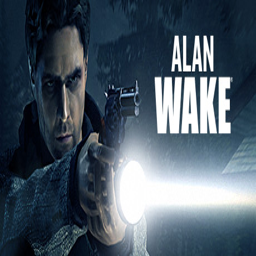

----------------------------------------------------------------------------------------------------


In [ ]:
# BioShock™
get_sim_game(rec_no_shuffle_yes_model, '7670')

## 선호도 구분 데이터 X / 셔플 X 모델

In [ ]:
from gensim.models import Word2Vec
import datetime

start = datetime.datetime.now()

rec_no_shuffle_no_model = Word2Vec(sentences = rec_no_shuffle_no_user_play_game_li,
                        iter = 10,
                        min_count = 5,
                        size = 300,
                        workers = 4,
                        sg = 1,
                        hs = 0,
                        negative = 5,
                        window = 9999999)

rec_no_shuffle_no_model.wv.save_word2vec_format(DATA_DIR + 'rec_no_shuffle_no_model') # 모델 저장

print("Time passed: " + str(datetime.datetime.now() - start))

Time passed: 0:47:56.895257


----------------------------------------------------------------------------------------------------
선택된 게임의 ID: 7670, 선택된 게임의 title: BioShock™
선택된 게임의 content: BioShock is a shooter unlike any you've ever played, loaded with weapons and tactics never seen. You'll have a complete arsenal at your disposal from simple revolvers to grenade launchers and chemical throwers, but you'll also be forced to genetically modify your DNA to create an even more deadly weapon: you.
선택된 게임의 genres: ['FPS', 'Atmospheric', 'Story Rich', 'Action', 'Singleplayer', 'Horror', 'Steampunk', 'First-Person', 'Shooter', 'Sci-fi', 'RPG', 'Classic', 'Adventure', 'Dystopian ', 'Underwater', 'Immersive', 'Dark', 'Political', 'Great Soundtrack', 'Alternate History']


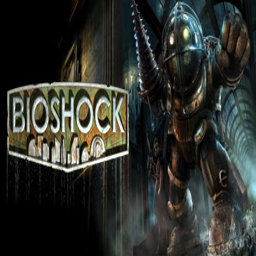

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP1 게임의 ID: 8850, title: BioShock® 2, Score: 0.8699178695678711
선택된 게임의 content: Set approximately 10 years after the events of the original BioShock, the halls of Rapture once again echo with sins of the past. Along the Atlantic coastline, a monster has been snatching little girls and bringing them back to the undersea city of Rapture.
선택된 게임의 genres: ['FPS', 'Action', 'Singleplayer', 'Atmospheric', 'Story Rich', 'Horror', 'Shooter', 'First-Person', 'Steampunk', 'Sci-fi', 'Multiplayer', 'Dystopian ', 'Underwater', 'Adventure', 'RPG', 'Immersive', 'Dark', 'Great Soundtrack', 'Philosophical', 'Action RPG']


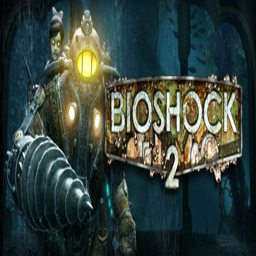

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP2 게임의 ID: 8870, title: BioShock Infinite, Score: 0.8676033616065979
선택된 게임의 content: Indebted to the wrong people, with his life on the line, veteran of the U.S. Cavalry and now hired gun, Booker DeWitt has only one opportunity to wipe his slate clean. He must rescue Elizabeth, a mysterious girl imprisoned since childhood and locked up in the flying city of Columbia.
선택된 게임의 genres: ['FPS', 'Story Rich', 'Action', 'Singleplayer', 'Steampunk', 'Atmospheric', 'Shooter', 'First-Person', 'Alternate History', 'Beautiful', 'Adventure', 'Great Soundtrack', 'Dystopian ', 'Sci-fi', 'Time Travel', 'Fantasy', 'Gore', 'Linear', 'RPG', 'Immersive']


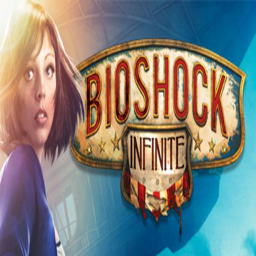

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP3 게임의 ID: 35140, title: Batman: Arkham Asylum Game of the Year Edition, Score: 0.8625795841217041
선택된 게임의 content: Experience what it’s like to be Batman and face off against Gotham's greatest villians. Explore every inch of Arkham Asylum and roam freely on the infamous island.
선택된 게임의 genres: ['Action', 'Stealth', 'Third Person', 'Superhero', 'Adventure', 'Singleplayer', 'Open World', "Beat 'em up", 'Detective', 'Comic Book', 'Atmospheric', 'Story Rich', 'Action-Adventure', 'Fighting', 'Controller', 'Metroidvania', 'Puzzle', '3D Vision', 'Horror', 'Dark']


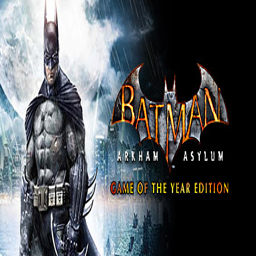

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP4 게임의 ID: 48000, title: LIMBO, Score: 0.8527256846427917
선택된 게임의 content: Uncertain of his sister's fate, a boy enters LIMBO
선택된 게임의 genres: ['Puzzle Platformer', 'Indie', 'Puzzle', 'Platformer', 'Dark', 'Atmospheric', 'Adventure', '2D', 'Singleplayer', 'Horror', 'Surreal', 'Short', 'Side Scroller', 'Difficult', 'Minimalist', 'Physics', 'Action', 'Casual', 'Cinematic', 'Controller']


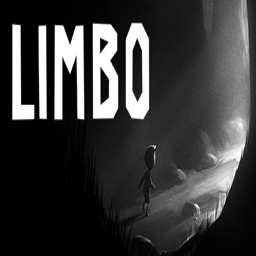

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP5 게임의 ID: 8980, title: Borderlands Game of the Year, Score: 0.8523982763290405
선택된 게임의 content: Get ready for the mind blowing insanity! Play as one of four trigger-happy mercenaries and take out everything that stands in your way! With its addictive action, frantic first-person shooter combat, massive arsenal of weaponry, RPG elements and four-player co-op, Borderlands is a breakthrough experience that challenges all the...
선택된 게임의 genres: ['Looter Shooter', 'FPS', 'Co-op', 'RPG', 'Action', 'Loot', 'Shooter', 'Online Co-Op', 'First-Person', 'Open World', 'Comedy', 'Multiplayer', 'Sci-fi', 'Post-apocalyptic', 'Singleplayer', 'Action RPG', 'Funny', 'Dark Humor', 'Adventure', 'Gore']


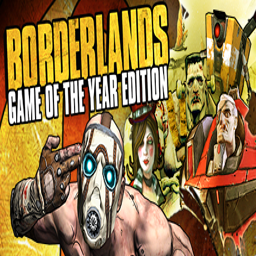

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP6 게임의 ID: 50300, title: Spec Ops: The Line, Score: 0.8504666090011597
선택된 게임의 content: A Third-Person modern military Shooter designed to challenge players' morality by putting them in the middle of unspeakable situations.
선택된 게임의 genres: ['Story Rich', 'Third-Person Shooter', 'Action', 'Psychological', 'Atmospheric', 'Singleplayer', 'War', 'Third Person', 'Shooter', 'Dark', 'Emotional', 'Multiplayer', 'Military', 'Adventure', 'Political', 'Mature', 'Great Soundtrack', 'Based On A Novel', 'Post-apocalyptic', 'Co-op']


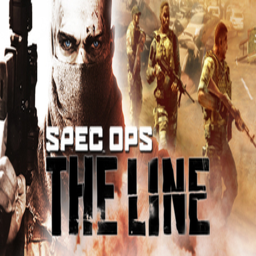

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP7 게임의 ID: 220, title: Half-Life 2, Score: 0.8425015211105347
선택된 게임의 content: 1998. HALF-LIFE sends a shock through the game industry with its combination of pounding action and continuous, immersive storytelling. Valve's debut title wins more than 50 game-of-the-year awards on its way to being named "Best PC Game Ever" by PC Gamer, and launches a franchise with more than eight million retail units sold worldwide.
선택된 게임의 genres: ['FPS', 'Action', 'Sci-fi', 'Classic', 'Singleplayer', 'Story Rich', 'Shooter', 'First-Person', 'Adventure', 'Dystopian ', 'Atmospheric', 'Zombies', 'Silent Protagonist', 'Physics', 'Aliens', 'Great Soundtrack', 'Horror', 'Puzzle', 'Multiplayer', 'Moddable']


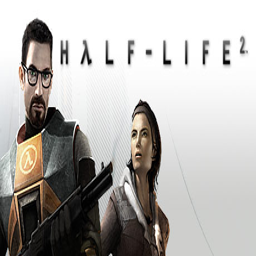

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP8 게임의 ID: 17410, title: Mirror's Edge™, Score: 0.8376758694648743
선택된 게임의 content: In a city where information is heavily monitored, couriers called Runners transport sensitive data. In this seemingly utopian paradise, a crime has been committed, & you are being hunted. You are a Runner called Faith and this innovative first-person action-adventure is your story.
선택된 게임의 genres: ['Parkour', 'First-Person', 'Action', 'Female Protagonist', 'Singleplayer', 'Great Soundtrack', 'Adventure', 'Platformer', 'Atmospheric', 'Dystopian ', 'Stylized', 'Futuristic', 'Sci-fi', 'FPS', 'Cyberpunk', 'Colorful', 'Puzzle', 'Time Attack', 'Classic', 'Short']


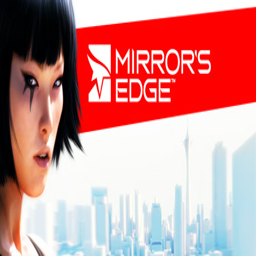

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP9 게임의 ID: 57300, title: Amnesia: The Dark Descent, Score: 0.8351005911827087
선택된 게임의 content: Amnesia: The Dark Descent, a first person survival horror. A game about immersion, discovery and living through a nightmare. An experience that will chill you to the core.
선택된 게임의 genres: ['Horror', 'Survival Horror', 'Atmospheric', 'Psychological Horror', 'Story Rich', 'First-Person', 'Adventure', 'Dark', 'Indie', 'Survival', 'Physics', 'Stealth', 'Puzzle', 'Singleplayer', 'Gore', 'Action', 'Exploration', 'Lovecraftian', 'Gothic', 'Great Soundtrack']


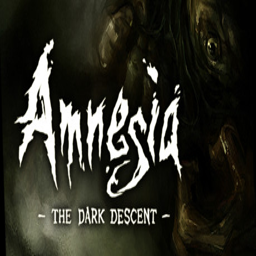

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
TOP10 게임의 ID: 108710, title: Alan Wake, Score: 0.8337340950965881
선택된 게임의 content: A Dark Presence stalks the small town of Bright Falls, pushing Alan Wake to the brink of sanity in his fight to unravel the mystery and save his love.
선택된 게임의 genres: ['Action', 'Horror', 'Adventure', 'Third Person', 'Story Rich', 'Thriller', 'Atmospheric', 'Singleplayer', 'Psychological Horror', 'Great Soundtrack', 'Mystery', 'Episodic', 'Third-Person Shooter', 'Dark', 'Supernatural', 'Cinematic', 'Narration', 'Survival Horror', 'Shooter', 'Survival']


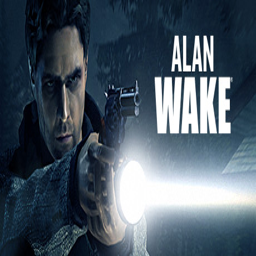

----------------------------------------------------------------------------------------------------


In [ ]:
# BioShock™
get_sim_game(rec_no_shuffle_no_model, '7670')